# Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, FunctionTransformer, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

# Import Data

In [2]:
# option to show all columns
pd.set_option('display.max_columns', None)

In [3]:
df = pd.read_csv('train.csv')

In [4]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1999,2000,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0,Unf,0,953,953,GasA,Ex,Y,SBrkr,953,694,0,1647,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1999.0,RFn,2,460,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1978,1988,Gable,CompShg,Plywood,Plywood,Stone,119.0,TA,TA,CBlock,Gd,TA,No,ALQ,790,Rec,163,589,1542,GasA,TA,Y,SBrkr,2073,0,0,2073,1,0,2,0,3,1,TA,7,Min1,2,TA,Attchd,1978.0,Unf,2,500,TA,TA,Y,349,0,0,0,0,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,9,1941,2006,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,Ex,Gd,Stone,TA,Gd,No,GLQ,275,Unf,0,877,1152,GasA,Ex,Y,SBrkr,1188,1152,0,2340,0,0,2,0,4,1,Gd,9,Typ,2,Gd,Attchd,1941.0,RFn,1,252,TA,TA,Y,0,60,0,0,0,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1950,1996,Hip,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,Mn,GLQ,49,Rec,1029,0,1078,GasA,Gd,

In [5]:
# instead of imputting for this variables I will use 0
df['MasVnrArea'] = df['MasVnrArea'].fillna(0)

# Feature Selection

In [6]:
df['MSSubClass'] = df['MSSubClass'].astype('category')
df=df.drop(['Id', 'PoolQC', 'MiscFeature', 'Alley'], axis=1)

In [7]:
# top 25 features from the baseline experiment (RF+GB)
selected_features = [
 'Neighborhood',
 'GarageCars',
 'Fireplaces',
 'GarageArea',
 'YearRemodAdd',
 'BsmtQual',
 'BsmtUnfSF',
 'LotArea',
 'BsmtFinSF1',
 'TotalBsmtSF',
 'ScreenPorch',
 'KitchenQual',
 'OverallQual',
 'WoodDeckSF',
 'MasVnrArea',
 'SaleCondition',
 'OpenPorchSF',
 'LotFrontage',
 'GrLivArea',
 '1stFlrSF',
 'YearBuilt',
 'OverallCond',
 'GarageType',
 'FullBath',
 '2ndFlrSF',
 'TotRmsAbvGrd',
 'GarageYrBlt',
 'ExterQual']

In [8]:
df=df[selected_features + ['SalePrice']]

In [9]:
numerical_features = ['GarageCars', 'Fireplaces', 'GarageArea', 'YearRemodAdd', 'BsmtUnfSF',
       'LotArea', 'BsmtFinSF1', 'TotalBsmtSF', 'ScreenPorch', 'OverallQual',
       'WoodDeckSF', 'MasVnrArea', 'OpenPorchSF', 'LotFrontage', 'GrLivArea',
       '1stFlrSF', 'YearBuilt', 'OverallCond', 'FullBath', '2ndFlrSF',
       'TotRmsAbvGrd', 'GarageYrBlt'
]

categorical_features = ['Neighborhood', 'BsmtQual', 'KitchenQual', 'SaleCondition',
       'GarageType', 'ExterQual'
]

target = 'SalePrice'

In [10]:
df[categorical_features] = df[categorical_features].astype('category')

In [11]:
neighborhood_order = [
    'NoRidge', 'NridgHt', 'StoneBr', 'Timber', 'Veenker', 'Somerst', 'ClearCr', 'Crawfor', 'CollgCr', 'Blmngtn', 'Gilbert',
    'NWAmes', 'SawyerW', 'Mitchel', 'NAmes', 'NPkVill', 'SWISU', 'Blueste', 'Sawyer', 'OldTown', 'Edwards', 'BrkSide', 'BrDale',
    'IDOTRR', 'MeadowV', 'NA'
]

bsmtQual_order = ['Ex', 'Gd', 'TA', 'Fa', 'NA']
kitchenQual_order = ['Ex', 'Gd', 'TA', 'Fa', 'NA']
SaleCondition_order = ['Partial', 'Normal', 'Alloca', 'Family', 'Abnorml', 'AdjLand', 'NA']
garageType_order = ['BuiltIn', 'Attchd', 'Basment', '2Types', 'Detchd', 'CarPort', 'NA']
exterQual_order = ['Ex', 'Gd', 'TA', 'Fa', 'NA']

# Train Test Split

In [12]:
X = df[numerical_features+categorical_features]
y = df[target]

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

# Outlier Removal

In [14]:
# for now I won't remove outliers

# Numerical Transformers

In [15]:
numeric_transformer = Pipeline(steps=[
    ('mean_imputer', SimpleImputer(strategy='median')),  # Impute with median
    ('scaler', StandardScaler())  # Scale with StandardScaler
])

# Categorical Transformers

In [16]:
categorical_transformer = Pipeline(steps=[
    ('constant_imputer', SimpleImputer(strategy='constant', fill_value='NA')),  # Impute with NA value instead of leaving null
    ('ordinal_encoder', OrdinalEncoder(categories = [neighborhood_order, bsmtQual_order, kitchenQual_order, SaleCondition_order, garageType_order, exterQual_order], 
                                       handle_unknown='use_encoded_value', 
                                       unknown_value=-1))  # ordinal encoder due to dimensionality issues coming from one hot enconding
])

# Preprocessing Pipeline

In [17]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num_transformer', numeric_transformer, numerical_features),
        ('cat_transformer', categorical_transformer, categorical_features),
    ])

# Modeling Functions

In [18]:
def show_results(y_test, y_pred):
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
    mape = mean_absolute_percentage_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)

    return {'mae': mae, 'mse': mse, 'rmse': rmse, 'mape': mape, 'r2': r2}

In [19]:
def get_output_df(X_test, y_pred, y_test):
    df_compare = X_test.copy()
    
    df_compare['pred'] = y_pred
    df_compare['target'] = y_test.values

    df_compare['absolute_error'] = (df_compare['pred'] - df_compare['target']).abs()
    
    return df_compare

In [20]:
# function to plot the feature importances of tree based algorithms
def show_feature_importances(model):
    feature_importances = model.named_steps['regressor'].feature_importances_
    feature_names = model.named_steps['preprocessor'].get_feature_names_out()
    
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': feature_importances
    }).sort_values(by='Importance', ascending=False)
    
    print(importance_df)
    
    # Plotting the horizontal bar chart
    plt.figure(figsize=(10, 8))
    plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title('Feature Importances')
    plt.gca().invert_yaxis()  # To display the most important feature at the top
    plt.tight_layout()

In [21]:
# Variable that stores the test scores of the different models to decide which one to use
report_ac = {}

# Modeling Parametrizations

In [22]:
metric_to_optimize = 'neg_mean_squared_error'

In [23]:
param_grid_lr = {
    # Linear Regression has no hyperparameters
}

param_grid_ridge = {
    'regressor__alpha': [0.01, 0.1, 1, 10, 100]
}

param_grid_lasso = {
    'regressor__alpha': [0.0001, 0.001, 0.01, 0.1, 1, 10]
}

param_grid_elastic_net = {
    'regressor__alpha': [0.01, 0.1, 1, 10],
    'regressor__l1_ratio': [0.1, 0.3, 0.5, 0.7, 0.9]
}

param_grid_svr = {
    'regressor__C': [0.1, 1, 10],
    'regressor__epsilon': [0.01, 0.1, 0.5],
    'regressor__kernel': ['linear', 'rbf']
}

param_grid_knn = {
    'regressor__n_neighbors': [3, 5, 7, 10],
    'regressor__weights': ['uniform', 'distance']
}

param_grid_mlp = {
    'regressor__hidden_layer_sizes': [(50,), (100,), (100, 50)],
    'regressor__activation': ['relu', 'tanh'],
    'regressor__alpha': [0.0001, 0.001, 0.01],
    'regressor__learning_rate': ['constant', 'adaptive']
}

param_grid_rf = {
    'regressor__n_estimators': [100, 200],
    'regressor__max_depth': [5, 10, 20],
    'regressor__min_samples_split': [2, 5]
}

param_grid_gb = {
    'regressor__n_estimators': [100, 200],
    'regressor__learning_rate': [0.05, 0.1, 0.2],
    'regressor__max_depth': [3, 5]
}

# Linear Regression

In [24]:
lr_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

In [25]:
grid_search_lr = GridSearchCV(
    estimator=lr_model,
    param_grid=param_grid_lr,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [26]:
grid_search_lr.fit(X_train, y_train)

lr_model = grid_search_lr.best_estimator_

y_pred_lr = lr_model.predict(X_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


In [27]:
print("Best hyperparameters:", grid_search_lr.best_params_)

results = show_results(y_test, y_pred_lr)
print(results)

report_ac['lr'] = results

Best hyperparameters: {}
{'mae': 22185.21234068858, 'mse': 994951672.8317691, 'rmse': 31542.85454475814, 'mape': 0.13829800733161193, 'r2': 0.8444653304163232}


In [28]:
# get_output_df(X_test, y_pred_lr, y_test)

# Ridge Regression

In [29]:
ridge_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', Ridge())
])

In [30]:
grid_search_ridge = GridSearchCV(
    estimator=ridge_model,
    param_grid=param_grid_ridge,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [31]:
grid_search_ridge.fit(X_train, y_train)

ridge_model = grid_search_ridge.best_estimator_

y_pred_ridge = ridge_model.predict(X_test)

Fitting 5 folds for each of 5 candidates, totalling 25 fits


In [32]:
print("Best hyperparameters:", grid_search_ridge.best_params_)

results = show_results(y_test, y_pred_ridge)
print(results)

report_ac['ridge'] = results

Best hyperparameters: {'regressor__alpha': 100}
{'mae': 21881.73000300491, 'mse': 983969826.6903116, 'rmse': 31368.293334038935, 'mape': 0.13402220309001855, 'r2': 0.8461820548137696}


# Lasso Regression

In [33]:
lasso_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', Lasso())
])

In [34]:
grid_search_lasso = GridSearchCV(
    estimator=lasso_model,
    param_grid=param_grid_lasso,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [35]:
grid_search_lasso.fit(X_train, y_train)

lasso_model = grid_search_lasso.best_estimator_

y_pred_lasso = lasso_model.predict(X_test)

Fitting 5 folds for each of 6 candidates, totalling 30 fits


In [36]:
print("Best hyperparameters:", grid_search_lasso.best_params_)

results = show_results(y_test, y_pred_lasso)
print(results)

report_ac['lasso'] = results

Best hyperparameters: {'regressor__alpha': 10}
{'mae': 22181.779051486727, 'mse': 994816801.2114549, 'rmse': 31540.716561477402, 'mape': 0.1382353704675248, 'r2': 0.8444864140663885}


# Elastic Net

In [37]:
elastic_net_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', ElasticNet())
])

In [38]:
grid_search_elastic_net = GridSearchCV(
    estimator=elastic_net_model,
    param_grid=param_grid_elastic_net,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [39]:
grid_search_elastic_net.fit(X_train, y_train)

elastic_net_model = grid_search_elastic_net.best_estimator_

y_pred_elastic_net = elastic_net_model.predict(X_test)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


In [40]:
print("Best hyperparameters:", grid_search_elastic_net.best_params_)

results = show_results(y_test, y_pred_elastic_net)
print(results)

report_ac['elastic_net'] = results

Best hyperparameters: {'regressor__alpha': 1, 'regressor__l1_ratio': 0.7}
{'mae': 21752.68621718885, 'mse': 1002657085.36316, 'rmse': 31664.760939618034, 'mape': 0.1293841677938535, 'r2': 0.8432607907137417}


# SVR

In [41]:
svr_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', SVR())
])

In [42]:
grid_search_svr = GridSearchCV(
    estimator=svr_model,
    param_grid=param_grid_svr,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [43]:
grid_search_svr.fit(X_train, y_train)

svr_model = grid_search_svr.best_estimator_

y_pred_svr = svr_model.predict(X_test)

Fitting 5 folds for each of 18 candidates, totalling 90 fits


In [44]:
print("Best hyperparameters:", grid_search_svr.best_params_)

results = show_results(y_test, y_pred_svr)
print(results)

report_ac['svr'] = results

Best hyperparameters: {'regressor__C': 10, 'regressor__epsilon': 0.5, 'regressor__kernel': 'linear'}
{'mae': 26585.926769724927, 'mse': 1847398933.3506873, 'rmse': 42981.37891402144, 'mape': 0.14125001968974957, 'r2': 0.7112074982796477}


# KNN Regressor

In [45]:
knn_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', KNeighborsRegressor())
])

In [46]:
grid_search_knn = GridSearchCV(
    estimator=knn_model,
    param_grid=param_grid_knn,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [47]:
grid_search_knn.fit(X_train, y_train)

knn_model = grid_search_knn.best_estimator_

y_pred_knn = knn_model.predict(X_test)

Fitting 5 folds for each of 8 candidates, totalling 40 fits


In [48]:
print("Best hyperparameters:", grid_search_knn.best_params_)

results = show_results(y_test, y_pred_knn)
print(results)

report_ac['knn'] = results

Best hyperparameters: {'regressor__n_neighbors': 3, 'regressor__weights': 'distance'}
{'mae': 22230.54544446594, 'mse': 1081404366.992386, 'rmse': 32884.71327216319, 'mape': 0.1296564316104621, 'r2': 0.8309507129850866}


# MLP Regressor

In [49]:
mlp_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', MLPRegressor())
])

In [50]:
grid_search_mlp = GridSearchCV(
    estimator=mlp_model,
    param_grid=param_grid_mlp,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [51]:
grid_search_mlp.fit(X_train, y_train)

mlp_model = grid_search_mlp.best_estimator_

y_pred_mlp = mlp_model.predict(X_test)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


In [52]:
print("Best hyperparameters:", grid_search_mlp.best_params_)

results = show_results(y_test, y_pred_mlp)
print(results)

report_ac['mlp'] = results

Best hyperparameters: {'regressor__activation': 'relu', 'regressor__alpha': 0.01, 'regressor__hidden_layer_sizes': (100, 50), 'regressor__learning_rate': 'adaptive'}
{'mae': 50807.70549651386, 'mse': 4484027567.891216, 'rmse': 66962.88201601851, 'mape': 0.2999927081944439, 'r2': 0.29903957627298616}


# Random Forest Regressor

In [53]:
rf_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor())
])

In [54]:
grid_search_rf = GridSearchCV(
    estimator=rf_model,
    param_grid=param_grid_rf,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [55]:
grid_search_rf.fit(X_train, y_train)

rf_model = grid_search_rf.best_estimator_

y_pred_rf = rf_model.predict(X_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [56]:
print("Best hyperparameters:", grid_search_rf.best_params_)

results = show_results(y_test, y_pred_rf)
print(results)

report_ac['rf'] = results

Best hyperparameters: {'regressor__max_depth': 20, 'regressor__min_samples_split': 5, 'regressor__n_estimators': 200}
{'mae': 18263.790027344337, 'mse': 762339211.7089838, 'rmse': 27610.49097189298, 'mape': 0.10777688238228134, 'r2': 0.8808282043826607}


                           Feature  Importance
9     num_transformer__OverallQual    0.567253
14      num_transformer__GrLivArea    0.094814
22   cat_transformer__Neighborhood    0.063514
19       num_transformer__2ndFlrSF    0.051600
7     num_transformer__TotalBsmtSF    0.027237
15       num_transformer__1stFlrSF    0.026160
6      num_transformer__BsmtFinSF1    0.022780
5         num_transformer__LotArea    0.020138
2      num_transformer__GarageArea    0.015437
0      num_transformer__GarageCars    0.011679
20   num_transformer__TotRmsAbvGrd    0.011304
18       num_transformer__FullBath    0.010298
10     num_transformer__WoodDeckSF    0.007187
11     num_transformer__MasVnrArea    0.006809
4       num_transformer__BsmtUnfSF    0.006216
16      num_transformer__YearBuilt    0.005946
13    num_transformer__LotFrontage    0.005930
3    num_transformer__YearRemodAdd    0.005607
12    num_transformer__OpenPorchSF    0.005319
17    num_transformer__OverallCond    0.005306
26     cat_tr

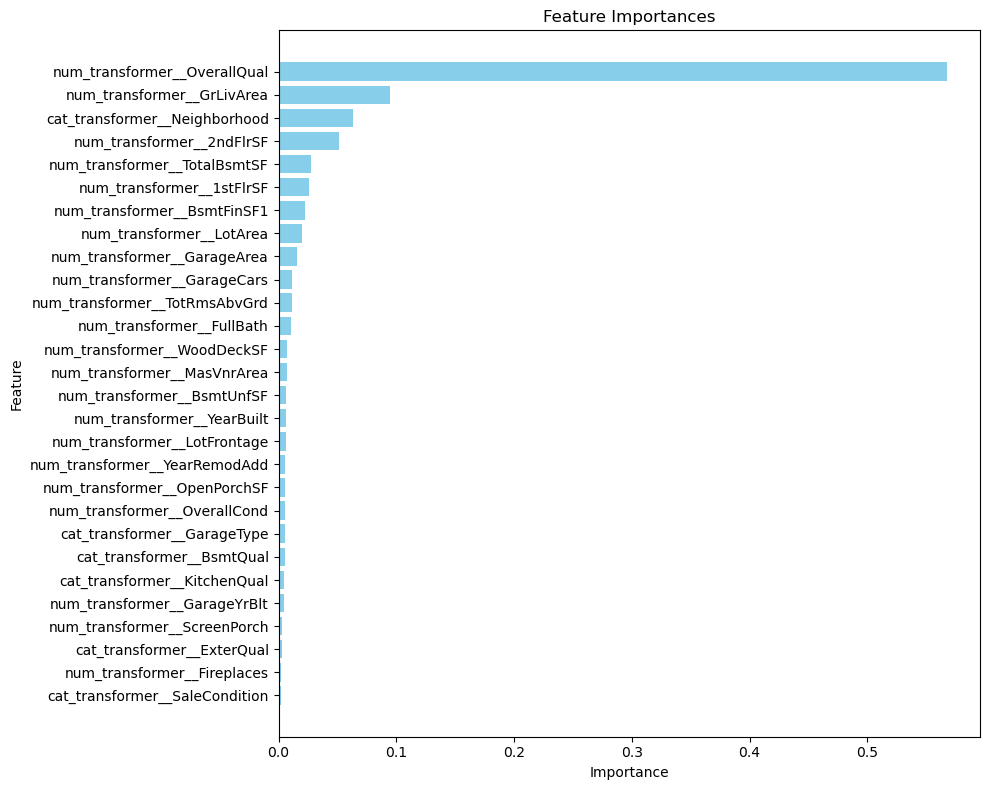

In [57]:
show_feature_importances(rf_model)

# Gradient Booster Regressor

In [58]:
gb_model = Pipeline(steps = [
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor())
])

In [59]:
grid_search_gb = GridSearchCV(
    estimator=gb_model,
    param_grid=param_grid_gb,
    cv=5,
    scoring=metric_to_optimize,
    return_train_score=True,
    n_jobs=-1,
    verbose=1
)

In [60]:
grid_search_gb.fit(X_train, y_train)

gb_model = grid_search_gb.best_estimator_

y_pred_gb = gb_model.predict(X_test)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [61]:
print("Best hyperparameters:", grid_search_gb.best_params_)

results = show_results(y_test, y_pred_gb)
print(results)

report_ac['gb'] = results

Best hyperparameters: {'regressor__learning_rate': 0.1, 'regressor__max_depth': 5, 'regressor__n_estimators': 200}
{'mae': 16798.746635354477, 'mse': 628599736.9453658, 'rmse': 25071.89137152133, 'mape': 0.09812692631473761, 'r2': 0.9017348731040178}


In [62]:
pd.set_option('display.max_rows', None)

get_output_df(X_test, y_pred_gb, y_test).sort_values(by=['absolute_error'], ascending=False)

,GarageCars,Fireplaces,GarageArea,YearRemodAdd,BsmtUnfSF,LotArea,BsmtFinSF1,TotalBsmtSF,ScreenPorch,OverallQual,WoodDeckSF,MasVnrArea,OpenPorchSF,LotFrontage,GrLivArea,1stFlrSF,YearBuilt,OverallCond,FullBath,2ndFlrSF,TotRmsAbvGrd,GarageYrBlt,Neighborhood,BsmtQual,KitchenQual,SaleCondition,GarageType,ExterQual,pred,target,absolute_error
688,2,1,567,2007,474,8089,945,1419,0,8,140,0.0,0,60.0,1419,1419,2007,6,2,0,7,2007.0,StoneBr,Gd,Gd,Partial,Attchd,Gd,228285.516309,392000,163714.483691
898,3,2,820,2010,142,12919,2188,2330,0,9,0,760.0,67,100.0,2364,2364,2009,5,2,0,11,2009.0,NridgHt,Ex,Ex,Partial,Attchd,Ex,500041.700692,611657,111615.299308
1373,3,2,804,2002,1351,11400,1282,2633,0,10,314,705.0,140,NaN,2633,2633,2001,5,2,0,8,2001.0,NoRidge,Ex,Ex,Normal,Attchd,Ex,393770.096673,466500,72729.903327
1142,3,1,1052,2007,316,9965,1150,1466,0,8,125,340.0,144,77.0,2828,1466,2006,5,3,1362,11,2006.0,CollgCr,Ex,Gd,Partial,BuiltIn,Gd,353149.849418,424870,71720.150582
1243,3,1,850,2006,690,13891,1386,2076,0,10,216,0.0,229,107.0,2076,2076,2006,5,2,0,7,2006.0,NridgHt,Ex,Ex,Partial,Attchd,Ex,393541.896065,465000,71458.103935
218,2,2,431,2006,457,15660,341,798,0,7,0,312.0,119,NaN,1954,1137,1939,9,1,817,8,1939.0,Crawfor,TA,Gd,Normal,Attchd,Gd,241048.325778,311500,70451.674222
112,3,1,792,2007,280,9965,984,1264,168,7,120,220.0,184,77.0,2696,1282,2007,5,2,1414,10,2007.0,CollgCr,Ex,Ex,Partial,BuiltIn,Gd,319080.876817,383970,64889.123183
685,2,1,577,1984,180,5062,828,1190,0,7,219,0.0,0,NaN,2090,1190,1984,5,2,900,6,1984.0,StoneBr,Gd,Gd,Normal,Attchd,Gd,269684.267870,207500,62184.267870
678,3,1,834,2008,2046,11844,0,2046,0,8,322,464.0,82,80.0,2046,2046,2008,5,2,0,7,2008.0,StoneBr,Ex,Gd,Partial,Attchd,Gd,312452.065861,372500,60047.934139
970,0,0,0,1950,720,10800,0,720,0,4,0,0.0,0,60.0,1192,720,1949,4,1,472,6,NaN,NAmes,TA,TA,Abnorml,NaN,TA,76906.239865,135000,58093.760135


                           Feature  Importance
9     num_transformer__OverallQual    0.537841
14      num_transformer__GrLivArea    0.094391
22   cat_transformer__Neighborhood    0.060074
19       num_transformer__2ndFlrSF    0.056101
15       num_transformer__1stFlrSF    0.033329
6      num_transformer__BsmtFinSF1    0.026911
7     num_transformer__TotalBsmtSF    0.025006
20   num_transformer__TotRmsAbvGrd    0.021092
0      num_transformer__GarageCars    0.020736
5         num_transformer__LotArea    0.019923
27      cat_transformer__ExterQual    0.019489
2      num_transformer__GarageArea    0.009983
23       cat_transformer__BsmtQual    0.008759
17    num_transformer__OverallCond    0.007560
24    cat_transformer__KitchenQual    0.007415
10     num_transformer__WoodDeckSF    0.005719
26     cat_transformer__GarageType    0.005443
4       num_transformer__BsmtUnfSF    0.005384
3    num_transformer__YearRemodAdd    0.005322
1      num_transformer__Fireplaces    0.004839
16      num_t

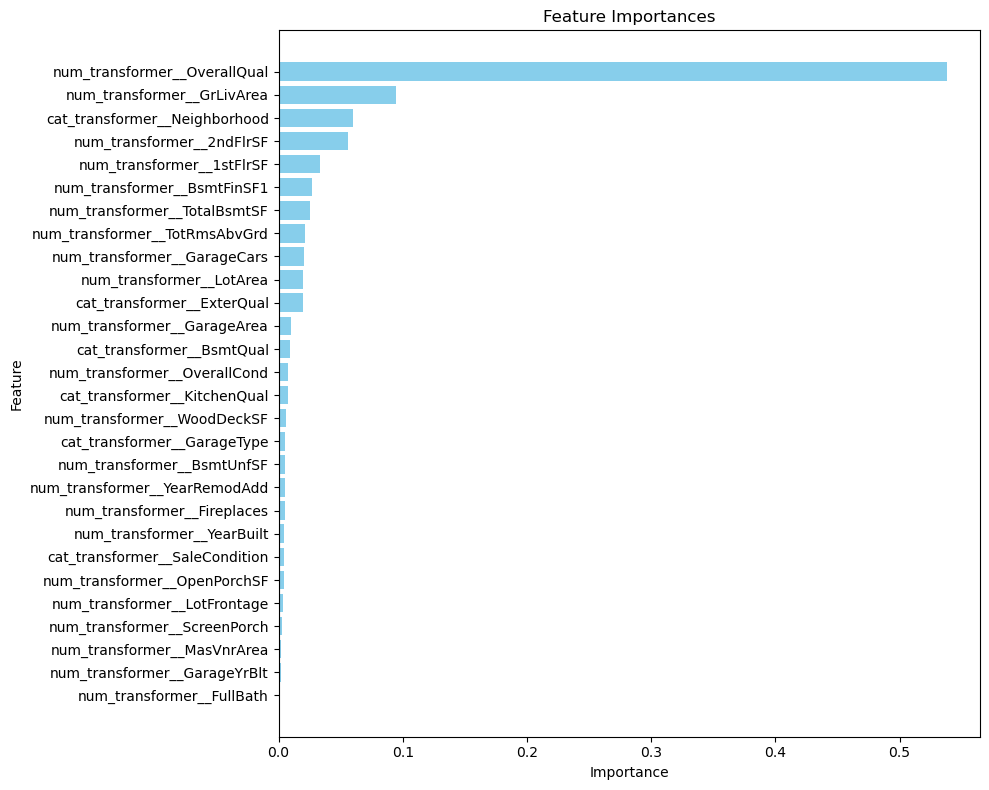

In [63]:
show_feature_importances(gb_model)

# Model Evaluation

In [64]:
report_ac

{'lr': {'mae': 22185.21234068858,
  'mse': 994951672.8317691,
  'rmse': 31542.85454475814,
  'mape': 0.13829800733161193,
  'r2': 0.8444653304163232},
 'ridge': {'mae': 21881.73000300491,
  'mse': 983969826.6903116,
  'rmse': 31368.293334038935,
  'mape': 0.13402220309001855,
  'r2': 0.8461820548137696},
 'lasso': {'mae': 22181.779051486727,
  'mse': 994816801.2114549,
  'rmse': 31540.716561477402,
  'mape': 0.1382353704675248,
  'r2': 0.8444864140663885},
 'elastic_net': {'mae': 21752.68621718885,
  'mse': 1002657085.36316,
  'rmse': 31664.760939618034,
  'mape': 0.1293841677938535,
  'r2': 0.8432607907137417},
 'svr': {'mae': 26585.926769724927,
  'mse': 1847398933.3506873,
  'rmse': 42981.37891402144,
  'mape': 0.14125001968974957,
  'r2': 0.7112074982796477},
 'knn': {'mae': 22230.54544446594,
  'mse': 1081404366.992386,
  'rmse': 32884.71327216319,
  'mape': 0.1296564316104621,
  'r2': 0.8309507129850866},
 'mlp': {'mae': 50807.70549651386,
  'mse': 4484027567.891216,
  'rmse': 66

# Testing against the real test set

In [65]:
df = pd.read_csv('test.csv')

In [66]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
5,1466,60,RL,75.0,10000,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,763.0,763.0,GasA,Gd,Y,SBrkr,763,892,0,1655,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1993.0,Fin,2.0,440.0,TA,TA,Y,157,84,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal
6,1467,20,RL,NaN,7980,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,7,1992,2007,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,Gd,PConc,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,GasA,Ex,Y,SBrkr,1187,0,0,1187,1.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Attchd,1992.0,Fin,2.0,420.0,TA,TA,Y,483,21,0,0,0,0,NaN,GdPrv,Shed,500,3,2010,WD,Normal
7,1468,60,RL,63.0,8402,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1998,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,789.0,789.0,GasA,Gd,Y,SBrkr,789,676,0,1465,0.0,0.0,2,1,3,1,TA,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,393.0,TA,TA,Y,0,75,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
8,1469,20,RL,85.0,10176,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,7,5,1990,1990,Gable,CompShg,HdBoard,HdBoard,NaN,0.0,TA,TA,PConc,Gd,TA,Gd,GLQ,637.0,Unf,0.0,663.0,1300.0,GasA,Gd,Y,SBrkr,1341,0,0,1341,1.0,0.0,1,1,2,1,Gd,5,Typ,1,Po,Attchd,1990.0,Unf,2.0,506.0,TA,TA,Y,192,0,0,0,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal
9,1470,20,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,4,5,1970,1970,Gable,CompShg,Plywood

In [67]:
# instead of imputting for this variables I will use 0
df['MasVnrArea'] = df['MasVnrArea'].fillna(0)

In [68]:
df['MSSubClass'] = df['MSSubClass'].astype('category')
df=df.drop(['Id', 'PoolQC', 'MiscFeature', 'Alley'], axis=1)

In [69]:
numerical_features = ['LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold'
]

# I dropped Alley, PoolQC, MiscFeature
categorical_features = ['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'Fence',
       'SaleType', 'SaleCondition'
]

target = 'SalePrice'

In [70]:
df[categorical_features] = df[categorical_features].astype('category')

In [71]:
X = df[numerical_features + categorical_features].copy()

In [72]:
df_compare = X.copy()
df_compare['pred'] = gb_model.predict(X)
df_compare

,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,FireplaceQu,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,Fence,SaleType,SaleCondition,pred
0,80.0,11622,5,6,1961,1961,0.0,468.0,144.0,270.0,882.0,896,0,0,896,0.0,0.0,1,0,2,1,5,0,1961.0,1.0,730.0,140,0,0,0,120,0,0,6,2010,20,RH,Pave,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,CBlock,TA,TA,No,Rec,LwQ,GasA,TA,Y,SBrkr,TA,Typ,NaN,Attchd,Unf,TA,TA,Y,MnPrv,WD,Normal,132166.741574
1,81.0,14267,6,6,1958,1958,108.0,923.0,0.0,406.0,1329.0,1329,0,0,1329,0.0,0.0,1,1,3,1,6,0,1958.0,1.0,312.0,393,36,0,0,0,0,12500,6,2010,20,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,TA,TA,CBlock,TA,TA,No,ALQ,Unf,GasA,TA,Y,SBrkr,Gd,Typ,NaN,Attchd,Unf,TA,TA,Y,NaN,WD,Normal,160985.589997
2,74.0,13830,5,5,1997,1998,0.0,791.0,0.0,137.0,928.0,928,701,0,1629,0.0,0.0,2,1,3,1,6,1,1997.0,2.0,482.0,212,34,0,0,0,0,0,3,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,MnPrv,WD,Normal,196293.275355
3,78.0,9978,6,6,1998,1998,20.0,602.0,0.0,324.0,926.0,926,678,0,1604,0.0,0.0,2,1,3,1,7,1,1998.0,2.0,470.0,360,36,0,0,0,0,0,6,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,TA,TA,PConc,TA,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,198136.800275
4,43.0,5005,8,5,1992,1992,0.0,263.0,0.0,1017.0,1280.0,1280,0,0,1280,0.0,0.0,2,0,2,1,5,0,1992.0,2.0,506.0,0,82,0,0,144,0,0,1,2010,120,RL,Pave,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,Gd,TA,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,NaN,Attchd,RFn,TA,TA,Y,NaN,WD,Normal,197793.722048
5,75.0,10000,6,5,1993,1994,0.0,0.0,0.0,763.0,763.0,763,892,0,1655,0.0,0.0,2,1,3,1,7,1,1993.0,2.0,440.0,157,84,0,0,0,0,0,4,2010,60,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,TA,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,175991.130837
6,NaN,7980,6,7,1992,2007,0.0,935.0,0.0,233.0,1168.0,1187,0,0,1187,1.0,0.0,2,0,3,1,6,0,1992.0,2.0,420.0,483,21,0,0,0,0,500,3,2010,20,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,Gd,PConc,Gd,TA,No,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,NaN,Attchd,Fin,TA,TA,Y,GdPrv,WD,Normal,174959.705867
7,63.0,8402,6,5,1998,1998,0.0,0.0,0.0,789.0,789.0,789,676,0,1465,0.0,0.0,2,1,3,1,7,1,1998.0,2.0,393.0,0,75,0,0,0,0,0,5,2010,60,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,NaN,TA,TA,PConc,Gd,TA,No,Unf,Unf,GasA,Gd,Y,SBrkr,TA,Typ,Gd,Attchd,Fin,TA,TA,Y,NaN,WD,Normal,165971.817587
8,85.0,10176,7,5,1990,1990,0.0,637.0,0.0,663.0,1300.0,1341,0,0,1341,1.0,0.0,1,1,2,1,5,1,1990.0,2.0,506.0,192,0,0,0,0,0,0,2,2010,20,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,Gable,CompShg,HdBoard,HdBoard,NaN,TA,TA,PConc,Gd,TA,Gd,GLQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Po,Attchd,Unf,TA,TA,Y,NaN,WD,Normal,174577.184626
9,70.0,8400,4,5,1970,1970,0.0,804.0,78.0,0.0,882.0,882,0,0,882,1.0,0.0,1,0,2,1,4,0,1970.0,2.0,525.0,240,0,0,0,0,0,0,4,2010,20,RL,Pave,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Norm,No

# Notes

I just changed the encoder to an ordinal encoder

The results were basically the same with a small improvement on both models: 

    - Random Forest Regressor with R2=0.881, MAE=18263.79 and RMSE=27610.49

    - Gradient Boost Regressor with R2=0.9017, MAE=16798.75 and RMSE=25071.89

Additional approaches would follow more feature engineering:

1 - Fill Na values with values that make sense for each feature instead of using NA for all of them (maybe this doesnt has impact)

2 - Add a age variable to the house -> yearsold-yearbuild (think about the remodelations)

3 - Add the area of the entire house (floors+basement+garage)

4 - Manually remove outliers through the scatter plots with respect to the target variable and remove values that are way off

In [ ]:
 'rf': {'mae': 18263.790027344337,
  'mse': 762339211.7089838,
  'rmse': 27610.49097189298,
  'mape': 0.10777688238228134,
  'r2': 0.8808282043826607},
 'gb': {'mae': 16798.746635354477,
  'mse': 628599736.9453658,
  'rmse': 25071.89137152133,
  'mape': 0.09812692631473761,
  'r2': 0.9017348731040178}}